In [ ]:
   from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
Root = "/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification"
os.chdir(Root)

In [ ]:
!pip install python-speech-features

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


[Dataset](https://www.kaggle.com/andradaolteanu/gtzan-dataset-music-genre-classification)

In [ ]:
import pandas as pd
import numpy as np
import os
import IPython.display as ipd
import librosa
import librosa.display
import matplotlib.pyplot as plt
import scipy.io.wavfile as wav
from python_speech_features import mfcc
from tempfile import TemporaryFile
import os
import math
import pickle
import random
import operator
%matplotlib inline

In [ ]:
audio_dataset_path='/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification/Data/genres_original'
metadata=pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification/Data/features_30_sec.csv')
metadata.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


**Feature Extractor Function**

Mel Frequency Cepstral Coefficients:

These are state-of-the-art features used in automatic speech and speech recognition studies. There are a set of steps for generation of these features:

Since the audio signals are constantly changing, first we divide these signals into smaller frames. Each frame is around 20-40 ms long
Then we try to identify different frequencies present in each frame
Now, separate linguistic frequencies from the noise
To discard the noise, it then takes discrete cosine transform (DCT) of these frequencies. Using DCT we keep only a specific sequence of frequencies that have a high probability of information.

In [ ]:
def features_extractor(file):
    audio, sample_rate = librosa.load(file_name, res_type='kaiser_fast')
    mfccs_features = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
    mfccs_scaled_features = np.mean(mfccs_features.T,axis=0)

    return mfccs_scaled_features

In [ ]:
# metadata.drop(labels=552, axis=0, inplace=True)

In [ ]:
from tqdm import tqdm
### Now we iterate through every audio file and extract features
### using Mel-Frequency Cepstral Coefficients

extracted_features=[]
for index_num,row in tqdm(metadata.iterrows()):
    try:
        final_class_labels=row["label"]
        file_name = os.path.join(os.path.abspath(audio_dataset_path), final_class_labels+'/',str(row["filename"]))
        data=features_extractor(file_name)
        extracted_features.append([data,final_class_labels])
    except Exception as e:
        print(f"Error: {e}")
        continue

554it [01:25,  9.49it/s]/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
557it [01:26,  4.41it/s]

Error: 


599it [01:30,  9.54it/s]/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
601it [01:30, 11.58it/s]

Error: [Errno 2] No such file or directory: '/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification/Data/genres_original/metal/metal.00000.wav'


902it [02:06, 12.04it/s]

Error: [Errno 2] No such file or directory: '/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification/Data/genres_original/rock/rock.00000.wav'


1000it [02:16,  7.34it/s]


In [ ]:
### converting extracted_features to Pandas dataframe
extracted_features_df=pd.DataFrame(extracted_features,columns=['feature','class'])
extracted_features_df.head()

,feature,class
0,"[-113.57065, 121.57179, -19.168142, 42.36642, ...",blues
1,"[-207.5017, 123.991264, 8.955127, 35.877647, 2...",blues
2,"[-90.722595, 140.4463, -29.09389, 31.684334, -...",blues
3,"[-199.5442, 150.09091, 5.6626782, 26.85908, 1....",blues
4,"[-160.3377, 126.219635, -35.58781, 22.148071, ...",blues


In [ ]:
extracted_features_df['class'].value_counts()

blues        100
classical    100
country      100
disco        100
hiphop       100
pop          100
reggae       100
jazz          99
metal         99
rock          99
Name: class, dtype: int64

**Split the dataset into independent and dependent dataset**

In [ ]:
X=np.array(extracted_features_df['feature'].tolist())
y=np.array(extracted_features_df['class'].tolist())

In [ ]:
X.shape

(997, 40)

In [ ]:
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
labelencoder=LabelEncoder()
y=to_categorical(labelencoder.fit_transform(y))

In [ ]:
y.shape

(997, 10)

**Train Test Split**

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=0)

In [ ]:
X_train

array([[-1.04675392e+02,  8.77509460e+01, -3.32513123e+01, ...,
        -2.38443661e+00, -1.36187017e+00, -7.19340086e-01],
       [-2.59876740e+02,  1.23187164e+02, -6.39084244e+00, ...,
        -6.73822832e+00, -3.91004443e+00,  3.17720938e+00],
       [-1.15707176e+02,  6.70756454e+01,  1.87352538e+00, ...,
        -3.44522524e+00, -1.73945498e+00, -4.34088111e-02],
       ...,
       [-1.24778605e+01,  9.13266830e+01, -2.30955830e+01, ...,
        -4.04354048e+00, -1.77468669e+00, -1.75448668e+00],
       [-1.90423065e+02,  1.29542053e+02, -7.84552956e+00, ...,
        -2.24016356e+00, -3.98439646e+00, -1.98053861e+00],
       [-9.62648697e+01,  9.09442902e+01, -3.22151260e+01, ...,
        -2.40931821e+00, -1.65089101e-01, -1.84808576e+00]], dtype=float32)

In [ ]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(797, 40)
(200, 40)
(797, 10)
(200, 10)


In [ ]:
import tensorflow as tf
print(tf.__version__)

2.9.2


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Dropout,Activation,Flatten
from tensorflow.keras.optimizers import Adam
from sklearn import metrics

In [ ]:
### No of classes
num_labels=y.shape[1]

In [ ]:
y.shape[1]

10

In [ ]:
model=Sequential()
model.add(Dense(1024,input_shape=(40,), activation="relu"))
model.add(Dropout(0.3))
model.add(Dense(512, activation="relu"))
model.add(Dropout(0.3))
model.add(Dense(256, activation="relu"))
model.add(Dropout(0.3))
model.add(Dense(128, activation="relu"))
model.add(Dropout(0.3))
model.add(Dense(64, activation="relu"))
model.add(Dropout(0.3))
model.add(Dense(32, activation="relu"))
model.add(Dropout(0.3))

###final layer
model.add(Dense(num_labels, activation="softmax"))

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_7 (Dense)             (None, 1024)              41984     
                                                                 
 dropout_6 (Dropout)         (None, 1024)              0         
                                                                 
 dense_8 (Dense)             (None, 512)               524800    
                                                                 
 dropout_7 (Dropout)         (None, 512)               0         
                                                                 
 dense_9 (Dense)             (None, 256)               131328    
                                                                 
 dropout_8 (Dropout)         (None, 256)               0         
                                                                 
 dense_10 (Dense)            (None, 128)              

In [ ]:
model.compile(loss='categorical_crossentropy',metrics=['accuracy'],optimizer='adam')

In [ ]:
import time
t = time.localtime()
current_time = time.strftime("%H:%M:%S", t)

In [ ]:
## Trianing my model
from tensorflow.keras.callbacks import ModelCheckpoint
from datetime import datetime

num_epochs = 100
num_batch_size = 32

checkpointer = ModelCheckpoint(filepath=f'saved_models/audio_classification_{current_time}.hdf5',
                               verbose=1, save_best_only=True)
start = datetime.now()

history = model.fit(X_train, y_train, batch_size=num_batch_size, epochs=num_epochs, validation_data=(X_test, y_test), callbacks=[checkpointer], verbose=1)


duration = datetime.now() - start
print("Training completed in time: ", duration)

Epoch 1/100
23/25 [==========================>...] - ETA: 0s - loss: 4.8423 - accuracy: 0.0992
Epoch 1: val_loss improved from inf to 2.32348, saving model to saved_models/audio_classification_09:22:16.hdf5
25/25 [==============================] - 2s 30ms/step - loss: 4.7312 - accuracy: 0.0966 - val_loss: 2.3235 - val_accuracy: 0.0800
Epoch 2/100
22/25 [=========================>....] - ETA: 0s - loss: 2.7000 - accuracy: 0.1037
Epoch 2: val_loss improved from 2.32348 to 2.27214, saving model to saved_models/audio_classification_09:22:16.hdf5
25/25 [==============================] - 1s 22ms/step - loss: 2.6665 - accuracy: 0.1054 - val_loss: 2.2721 - val_accuracy: 0.1900
Epoch 3/100
25/25 [==============================] - ETA: 0s - loss: 2.3754 - accuracy: 0.1205
Epoch 3: val_loss did not improve from 2.27214
25/25 [==============================] - 1s 24ms/step - loss: 2.3754 - accuracy: 0.1205 - val_loss: 2.2835 - val_accuracy: 0.0950
Epoch 4/100
23/25 [==========================>...]

In [ ]:
model.evaluate(X_test,y_test,verbose=0)

[1.8797106742858887, 0.5799999833106995]

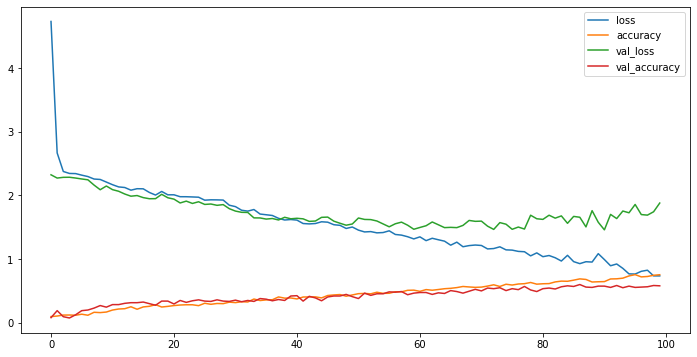

In [ ]:
pd.DataFrame(history.history).plot(figsize=(12,6))
plt.show()

In [ ]:
print("predict :")
print(np.argmax(model.predict(X_test), axis=-1))

predict :
7/7 [==============================] - 0s 4ms/step
[2 7 0 3 6 7 1 2 8 2 6 4 1 1 5 7 6 5 9 1 8 5 3 0 1 7 5 2 2 6 7 3 0 5 6 6 9
 5 2 7 6 9 7 3 0 5 8 3 5 6 5 8 6 8 2 2 9 2 3 6 9 8 2 9 8 2 1 3 9 1 6 3 2 9
 4 9 8 4 6 0 2 6 8 2 2 5 8 8 8 2 3 0 9 4 6 7 7 5 2 2 5 2 4 2 1 4 7 8 1 6 0
 4 8 3 6 2 4 6 3 5 4 8 2 2 0 9 1 8 0 7 2 2 5 4 1 3 2 4 9 2 9 9 0 0 9 0 4 3
 4 2 6 5 7 8 8 3 4 3 4 8 3 2 6 4 7 1 7 5 7 5 8 6 1 7 7 1 9 7 0 3 2 3 9 5 7
 9 0 6 9 7 9 6 1 2 2 2 6 2 2 1]


In [ ]:
filename="/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification/Data/genres_original/blues/blues.00000.wav"
audio, sample_rate = librosa.load(filename, res_type='kaiser_fast')
mfccs_features = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
mfccs_scaled_features = np.mean(mfccs_features.T,axis=0)
print(mfccs_scaled_features)
mfccs_scaled_features=mfccs_scaled_features.reshape(1,-1)
print(mfccs_scaled_features)
print(mfccs_scaled_features.shape)
predicted_label=np.argmax(model.predict(mfccs_scaled_features), axis=-1)
print(predicted_label)


[-1.1357065e+02  1.2157179e+02 -1.9168142e+01  4.2366421e+01
 -6.3646641e+00  1.8623499e+01 -1.3704891e+01  1.5343150e+01
 -1.2274110e+01  1.0976572e+01 -8.3265734e+00  8.8037930e+00
 -3.6723001e+00  5.7479949e+00 -5.1628819e+00  7.5273985e-01
 -1.6902149e+00 -4.0897894e-01 -2.3035226e+00  1.2212901e+00
 -3.5343504e+00 -1.1414334e+00 -4.2830324e+00 -4.2261953e+00
  9.1561663e-01  9.1268736e-01 -5.7613473e+00 -3.9327433e+00
  1.5108240e+00  2.6988823e+00  5.6574712e+00 -3.2662375e+00
 -2.0303418e-01 -3.0002940e+00  4.4772329e+00 -4.7590593e-01
  6.0092382e+00 -5.8892559e-02 -3.4585075e+00 -1.8423905e+00]
[[-1.1357065e+02  1.2157179e+02 -1.9168142e+01  4.2366421e+01
  -6.3646641e+00  1.8623499e+01 -1.3704891e+01  1.5343150e+01
  -1.2274110e+01  1.0976572e+01 -8.3265734e+00  8.8037930e+00
  -3.6723001e+00  5.7479949e+00 -5.1628819e+00  7.5273985e-01
  -1.6902149e+00 -4.0897894e-01 -2.3035226e+00  1.2212901e+00
  -3.5343504e+00 -1.1414334e+00 -4.2830324e+00 -4.2261953e+00
   9.1561663e-01 

In [ ]:
prediction_class = labelencoder.inverse_transform(predicted_label)
print(prediction_class)

['country']


In [ ]:
filename="/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification/Data/genres_original/metal/dbz.wav"
audio, sample_rate = librosa.load(filename, res_type='kaiser_fast')
mfccs_features = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
mfccs_scaled_features = np.mean(mfccs_features.T,axis=0)
print(mfccs_scaled_features)
mfccs_scaled_features=mfccs_scaled_features.reshape(1,-1)
print(mfccs_scaled_features)
print(mfccs_scaled_features.shape)
predicted_label=np.argmax(model.predict(mfccs_scaled_features), axis=-1)
print(predicted_label)

[-52.884026    50.089535   -11.489732    46.322777     6.538486
  10.112269     5.48486      8.84923      5.9355917    6.6283245
  -4.0324984    9.778783    -3.1140618    3.6563003   -6.50012
   1.0839598   -4.4859877    4.707357    -2.7545793    0.49985588
  -9.292718     2.02645     -3.488299     2.5048544   -4.657614
  -1.8981103   -5.6848426   -3.1841087   -4.8155446    0.86037755
  -5.733621    -0.40469193  -5.273206     0.4651634   -0.6073936
  -0.66032296  -2.42943      1.9502478   -4.049847    -2.848999  ]
[[-52.884026    50.089535   -11.489732    46.322777     6.538486
   10.112269     5.48486      8.84923      5.9355917    6.6283245
   -4.0324984    9.778783    -3.1140618    3.6563003   -6.50012
    1.0839598   -4.4859877    4.707357    -2.7545793    0.49985588
   -9.292718     2.02645     -3.488299     2.5048544   -4.657614
   -1.8981103   -5.6848426   -3.1841087   -4.8155446    0.86037755
   -5.733621    -0.40469193  -5.273206     0.4651634   -0.6073936
   -0.66032296  -2.4

In [ ]:
prediction_class = labelencoder.inverse_transform(predicted_label)
print(prediction_class)

['metal']


In [ ]:
filename="/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification/Data/genres_original/rock/mgk.wav"
audio, sample_rate = librosa.load(filename, res_type='kaiser_fast')
mfccs_features = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
mfccs_scaled_features = np.mean(mfccs_features.T,axis=0)
print(mfccs_scaled_features)
mfccs_scaled_features=mfccs_scaled_features.reshape(1,-1)
print(mfccs_scaled_features)
print(mfccs_scaled_features.shape)
predicted_label=np.argmax(model.predict(mfccs_scaled_features), axis=-1)
print(predicted_label)

[-1.16604362e+02  1.09250702e+02 -2.31651344e+01  4.06887398e+01
 -1.18884468e+01  2.31580906e+01 -1.54111776e+01  1.51284952e+01
 -1.35307398e+01  1.26946936e+01 -1.08737402e+01  8.50145721e+00
 -1.15815220e+01  2.19919491e+00 -6.18431234e+00  1.99284613e+00
 -7.95480013e+00  2.08888769e+00 -2.40047264e+00 -1.54583764e+00
 -2.62950039e+00 -4.24494028e-01 -3.03066754e+00 -8.07371914e-01
  1.07196614e-01 -2.70782542e+00 -1.16410267e+00 -6.56142759e+00
  8.06209743e-01 -5.98608303e+00 -6.39728487e-01  1.83372438e+00
 -1.91001439e+00 -2.85627079e+00 -2.22906327e+00 -8.13088119e-02
 -3.61306071e+00 -1.35417974e+00  2.53220648e-01 -2.90502810e+00]
[[-1.16604362e+02  1.09250702e+02 -2.31651344e+01  4.06887398e+01
  -1.18884468e+01  2.31580906e+01 -1.54111776e+01  1.51284952e+01
  -1.35307398e+01  1.26946936e+01 -1.08737402e+01  8.50145721e+00
  -1.15815220e+01  2.19919491e+00 -6.18431234e+00  1.99284613e+00
  -7.95480013e+00  2.08888769e+00 -2.40047264e+00 -1.54583764e+00
  -2.62950039e+00 -

In [ ]:
prediction_class = labelencoder.inverse_transform(predicted_label)
print(prediction_class)

['country']


In [ ]:
# The prediction class predicts that the aduio file blues.00000.wav belongs to the blues genre and the same can be executed for all the other audio files that are available in the dataset

In [ ]:
import librosa, IPython
import librosa.display
file = '/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification/Data/genres_original/blues/blues.00000.wav'
signal, sr = librosa.load(file , sr = 22050)
IPython.display.Audio(signal, rate=sr)

USING KNN FOR MUSIC CLASSIFIER

In [ ]:
def distance(instance1, instance2, k):
    distance = 0
    mm1 = instance1[0]
    cm1 = instance1[1]
    mm2 = instance2[0]
    cm2 = instance2[1]
    distance = np.trace(np.dot(np.linalg.inv(cm2), cm1))
    distance += (np.dot(np.dot((mm2-mm1).transpose(), np.linalg.inv(cm2)), mm2-mm1))
    distance += np.log(np.linalg.det(cm2)) - np.log(np.linalg.det(cm1))
    distance -= k
    return distance

In [ ]:
def getNeighbors(trainingset, instance, k):
    distances = []
    for x in range(len(trainingset)):
        dist = distance(trainingset[x], instance, k) + distance(instance,trainingset[x],k)
        distances.append((trainingset[x][2], dist))
    distances.sort(key=operator.itemgetter(1))
    neighbors = []
    for x in range(k):
        neighbors.append(distances[x][0])
    return neighbors

In [ ]:
def nearestclass(neighbors):
    classVote = {}

    for x in range(len(neighbors)):
        response = neighbors[x]
        if response in classVote:
            classVote[response] += 1
        else:
            classVote[response] = 1

    sorter = sorted(classVote.items(), key=operator.itemgetter(1), reverse=True)
    return sorter[0][0]

In [ ]:
def getAccuracy(testSet, prediction):
    correct = 0
    for x in range(len(testSet)):
        if testSet[x][-1] == prediction[x]:
            correct += 1
    return 1.0 * correct / len(testSet)

In [ ]:
import librosa, IPython
import librosa.display
file = '/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification/Data/genres_original/disco/disco.00011.wav'
signal, sr = librosa.load(file , sr = 22050)
IPython.display.Audio(signal, rate=sr)

In [ ]:
directory = '/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification/Data/genres_original'
f = open("my.dat", "wb")
i = 0
for folder in os.listdir(directory):
    #print(folder)
    i += 1
    if i == 11:
        break
    for file in os.listdir(directory+"/"+folder):
        #print(file)
        try:
            (rate, sig) = wav.read(directory+"/"+folder+"/"+file)
            mfcc_feat = mfcc(sig, rate, winlen = 0.020, appendEnergy=False)
            covariance = np.cov(np.matrix.transpose(mfcc_feat))
            mean_matrix = mfcc_feat.mean(0)
            feature = (mean_matrix, covariance, i)
            pickle.dump(feature, f)
        except Exception as e:
            print("Got an exception: ", e, 'in folder: ', folder, ' filename: ', file)
f.close()

Got an exception:  File format b'\xcb\x15\x1e\x16' not understood. Only 'RIFF' and 'RIFX' supported. in folder:  jazz  filename:  jazz.00054.wav


In [ ]:
dataset = []

def loadDataset(filename, split, trset, teset):
    with open('my.dat','rb') as f:
        while True:
            try:
                dataset.append(pickle.load(f))
            except EOFError:
                f.close()
                break
    for x in range(len(dataset)):
        if random.random() < split:
            trset.append(dataset[x])
        else:
            teset.append(dataset[x])

trainingSet = []
testSet = []
loadDataset('my.dat', 0.48, trainingSet, testSet)

In [ ]:
length = len(testSet)
predictions = []
for x in range(length):
    predictions.append(nearestclass(getNeighbors(trainingSet, testSet[x], 5)))

accuracy1 = getAccuracy(testSet, predictions)
print("ACCURACY :",accuracy1)

ACCURACY : 0.6742424242424242


In [ ]:
from collections import defaultdict
results = defaultdict(int)

directory = "/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification/Data/genres_original"

i = 1
for folder in os.listdir(directory):
    results[i] = folder
    i += 1

In [ ]:

def predict_gen():
  pred = nearestclass(getNeighbors(dataset, feature, 5))
  print(results[pred])

In [ ]:
predict_gen()

rock


In [ ]:
# Random forest classifier
data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification/Data/features_3_sec.csv')
data = data.iloc[0:, 1:]


In [ ]:
from sklearn import preprocessing
from sklearn.preprocessing import minmax_scale
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

In [ ]:
y = data['label']
X = data.loc[:, data.columns != 'label']
cols = X.columns
min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)
X = pd.DataFrame(np_scaled, columns = cols)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.2,random_state=0)

In [ ]:
model = RandomForestClassifier(n_estimators=1000, max_depth=10, random_state=0)
model.fit(X_train, y_train)
preds = model.predict(X_test)
print('Accuracy:', round(accuracy_score(y_test, preds)))

Accuracy: 1


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(y_test,preds))
print(classification_report(y_test,preds))

[[157   0   5   3   1   8   5   0   0   0]
 [  0 188   3   0   0   2   0   0   0   0]
 [ 15   2 160   9   0   9   3   0   8   4]
 [  2   3   6 144  12   1   4   1   5   7]
 [  3   1   3   8 159   0   7  18  15   3]
 [  4   8   6   4   0 173   0   1   0   1]
 [  3   0   0   2   5   1 196   0   2   8]
 [  0   1  12   8   5   1   0 150   9   4]
 [  8   2   9   5   5   2   0   8 177   4]
 [ 10   3  10  18   1   9  10   2  11 116]]
              precision    recall  f1-score   support

       blues       0.78      0.88      0.82       179
   classical       0.90      0.97      0.94       193
     country       0.75      0.76      0.75       210
       disco       0.72      0.78      0.75       185
      hiphop       0.85      0.73      0.79       217
        jazz       0.84      0.88      0.86       197
       metal       0.87      0.90      0.89       217
         pop       0.83      0.79      0.81       190
      reggae       0.78      0.80      0.79       220
        rock       0.79     

## CUSTOM_DATA IS A DATASET MADE BY ME( SACHIN THE AUTHOR OF THIS CODE AND PROJECT) WHICH INLCUDES TWO SONGS ONE OF WHICH IS METAL AND OTHER IS ROCK NAMELY;

## 1) ssj 3 ROCK THEME - BY BRUCE FAULCONER
### 2) mACHINE gUN KELLY mgk - bLOODY VALENTINE

In [ ]:
data.head(10)

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,3714.560359,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,3869.682242,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,3997.639160,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,3568.300218,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,3469.992864,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues
5,66149,0.376670,0.089702,0.132618,0.003583,1994.915219,211700.619569,2152.767854,74263.873102,4371.985614,...,31.448069,-3.448373,34.284130,-0.416165,40.791092,-3.649625,32.457901,3.025218,28.892687,blues
6,66149,0.379909,0.088827,0.130335,0.003166,1962.150096,177443.070045,2146.503479,98020.541422,4325.026668,...,33.954071,-2.068194,25.623655,1.428141,47.957699,-3.267124,39.382240,3.276939,25.999132,blues
7,66149,0.331880,0.092119,0.140600,0.002546,1701.890924,35678.130616,1979.387612,36670.725886,3625.280386,...,38.456211,-3.637886,24.530296,-0.105148,26.716150,-2.016985,23.150423,0.210787,42.512966,blues
8,66149,0.347877,0.094209,0.133130,0.002538,1746.473502,138073.931244,1887.619723,117069.920049,3586.934721,...,44.311455,-4.370029,29.873167,2.114592,33.843155,-2.264663,80.812393,3.758598,97.618835,blues
9,66149,0.358061,0.082957,0.115312,0.001846,1763.948942,61493.423121,1874.195710,51944.921435,3505.522649,...,43.967834,-3.448304,48.671944,0.099792,41.839546,-7.677177,96.253654,0.791776,40.416420,blues


In [ ]:
from glob import glob

#NOTE: the word 'normal' used in this notebook doesn't imply a normal distribution, is just used to denote non-anomalous examples

#directories of normal and abnormal audios
norm_data_dir = './audio-processing-files/normals/'
norm_audio_files = glob(norm_data_dir  + '*.mp3')

abnorm_data_dir = './audio-processing-files/abnormals/'
abnorm_audio_files = glob(abnorm_data_dir + '*.mp3')

'''
WARNING :
    glob library doesn't retrieve files on specific order. Be sure to control the order when retrieving
    production data in order to ensure a reproducible model.
'''

print(f'Number of normal audios : {len(norm_audio_files)}')
print(f'Number of abnormal audios : {len(abnorm_audio_files )}')

Number of normal audios : 0
Number of abnormal audios : 0


In [ ]:
import librosa
from librosa import feature
import numpy as np
fn_list_i = [
 feature.chroma_stft,
 feature.spectral_centroid,
 feature.spectral_bandwidth,
 feature.spectral_rolloff
]

fn_list_ii = [
 feature.rms,
 feature.zero_crossing_rate
]
def get_feature_vector(y,sr):
   feat_vect_i = [ np.mean(funct(y,sr)) for funct in fn_list_i]
   feat_vect_ii = [ np.mean(funct(y)) for funct in fn_list_ii]
   feature_vector = feat_vect_i + feat_vect_ii
   return feature_vector

In [ ]:
import csv
norm_output = 'custom_dataset.csv'
header =[
 'chroma_stft',
 'spectral_centroid',
 'spectral_bandwidth',
 'spectral_rolloff',
 'rmse',
 'zero_crossing_rate'
]
with open(norm_output,'+w') as f:
 csv_writer = csv.writer(f, delimiter = ',')
 csv_writer.writerow(header)
 csv_writer.writerows(norm_audios_feat)

NameError: ignored

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
os.path.abspath(norm_output)

'/content/drive/My Drive/Colab Notebooks/Music_Genre_Classification/custom_dataset.csv'

In [ ]:
data=pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification/custom_dataset.csv')

In [ ]:
audio_dataset_path='/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification/custom_data'
metadata=pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification/custom_dataset.csv')
metadata.head()

In [ ]:
metadata.shape

(1000, 60)

In [ ]:
import librosa, IPython
import librosa.display
file = '/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification/custom_data/metal/dbz.wav'
signal, sr = librosa.load(file , sr = 22050)
IPython.display.Audio(signal, rate=sr)

In [ ]:
from glob import glob
norm_data_dir = '/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification/custom_data/metal/'
norm_audio_files = glob(norm_data_dir + '*.wav')

In [ ]:
norm_audio_files

['/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification/custom_data/metal/dbz.wav',
 '/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification/custom_data/metal/mgk.wav']

In [ ]:
os.listdir('/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification/custom_data/metal')

['mt', 'dbz.wav', '.ipynb_checkpoints', 'mgk.wav']

In [ ]:
norm_audio_files

['/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification/custom_data/metal/dbz.wav',
 '/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification/custom_data/metal/mgk.wav']

In [ ]:
norm_audios_feat = []
for file in norm_audio_files:
   y , sr = librosa.load(file,sr=None)
   feature_vector = get_feature_vector(y, sr)
   norm_audios_feat.append(feature_vector)

In [ ]:
audio_dataset_path='/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification/custom_data'
metadata=pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification/custom_dataset.csv')
metadata.head()

,chroma_stft,spectral_centroid,spectral_bandwidth,spectral_rolloff,rmse,zero_crossing_rate


In [ ]:
prediction_class = labelencoder.inverse_transform(predicted_label)
print(prediction_class)

['country']


In [ ]:
filename="/content/drive/MyDrive/Colab Notebooks/Music_Genre_Classification/Data/genres_original/rock/mgk.wav"
audio, sample_rate = librosa.load(filename, res_type='kaiser_fast')
mfccs_features = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=58)
mfccs_scaled_features = np.mean(mfccs_features.T,axis=0)
print(mfccs_scaled_features)
mfccs_scaled_features=mfccs_scaled_features.reshape(1,-1)
print(mfccs_scaled_features)
print(mfccs_scaled_features.shape)
predicted_label=np.argmax(model.predict(mfccs_scaled_features), axis=-1)
print(predicted_label)

[-1.16604362e+02  1.09250702e+02 -2.31651344e+01  4.06887398e+01
 -1.18884468e+01  2.31580906e+01 -1.54111776e+01  1.51284952e+01
 -1.35307398e+01  1.26946936e+01 -1.08737402e+01  8.50145721e+00
 -1.15815220e+01  2.19919491e+00 -6.18431234e+00  1.99284613e+00
 -7.95480013e+00  2.08888769e+00 -2.40047264e+00 -1.54583764e+00
 -2.62950039e+00 -4.24494028e-01 -3.03066754e+00 -8.07371914e-01
  1.07196614e-01 -2.70782542e+00 -1.16410267e+00 -6.56142759e+00
  8.06209743e-01 -5.98608303e+00 -6.39728487e-01  1.83372438e+00
 -1.91001439e+00 -2.85627079e+00 -2.22906327e+00 -8.13088119e-02
 -3.61306071e+00 -1.35417974e+00  2.53220648e-01 -2.90502810e+00
 -2.91207433e+00 -2.54579234e+00 -2.10617685e+00 -2.80446100e+00
  2.48726517e-01 -3.44223171e-01  2.76784444e+00  4.06768942e+00
  4.74899530e+00  1.65410519e+00 -1.18007533e-01  1.44382215e+00
  2.68172145e+00  8.32734764e-01 -1.07868481e+00 -3.68076301e+00
 -3.24820995e+00 -1.99444127e+00]
[[-1.16604362e+02  1.09250702e+02 -2.31651344e+01  4.068

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  "X does not have valid feature names, but"


0


In [ ]:
prediction_class = labelencoder.inverse_transform(predicted_label)
print(prediction_class)

ValueError: ignored

In [ ]:
!pip install flask-ngrok

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from flask import Flask
from flask_ngrok import run_with_ngrok
app = Flask(__name__)
run_with_ngrok(app)

@app.route("/")
def home():
    return "<h1>MUSIC GENRE CLASSIFIER</h1>"
app.run()

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: off


INFO:werkzeug: * Running on http://127.0.0.1:5000/ (Press CTRL+C to quit)


 * Running on http://99be-34-28-60-118.ngrok.io
 * Traffic stats available on http://127.0.0.1:4040


INFO:werkzeug:127.0.0.1 - - [19/Nov/2022 09:39:16] "GET / HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [19/Nov/2022 09:39:17] "GET /favicon.ico HTTP/1.1" 404 -
INFO:werkzeug:127.0.0.1 - - [19/Nov/2022 09:39:18] "GET / HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [19/Nov/2022 09:42:22] "GET / HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [19/Nov/2022 09:42:23] "GET /favicon.ico HTTP/1.1" 404 -
INFO:werkzeug:127.0.0.1 - - [19/Nov/2022 09:44:35] "GET / HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [19/Nov/2022 09:44:36] "GET /favicon.ico HTTP/1.1" 404 -
INFO:werkzeug:127.0.0.1 - - [19/Nov/2022 09:46:19] "GET / HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [19/Nov/2022 09:46:19] "GET /favicon.ico HTTP/1.1" 404 -
